# 1. Importing Libraries

In [5]:
# Data Science Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Feature Scaling
from sklearn.preprocessing import StandardScaler
# Machine Learning model
from sklearn.neighbors import KNeighborsClassifier
# Machine Learning library for train test
from sklearn.model_selection import train_test_split
# Machine learning library for performance Matrix
from sklearn.metrics import confusion_matrix , precision_score,recall_score,f1_score,f1_score,classification_report

# 2.Loading the dataset / Data Collection

In [6]:
df = pd.read_csv('E:/ML_Datasets/heart.csv')

In [7]:
df

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,M,TA,110,264,0,Normal,132,N,1.2,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.4,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.2,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.0,Flat,1


# 3. EDA : Exploratory Data Analyasis

## Head

In [8]:
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


## Tail

In [9]:
df.tail()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
913,45,M,TA,110,264,0,Normal,132,N,1.2,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.4,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.2,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.0,Flat,1
917,38,M,NAP,138,175,0,Normal,173,N,0.0,Up,0


## Shape

In [10]:
df.shape

(918, 12)

## Size

In [11]:
df.size

11016

## dtypes

In [12]:
df.dtypes

Age                 int64
Sex                object
ChestPainType      object
RestingBP           int64
Cholesterol         int64
FastingBS           int64
RestingECG         object
MaxHR               int64
ExerciseAngina     object
Oldpeak           float64
ST_Slope           object
HeartDisease        int64
dtype: object

## Columns

In [13]:
df.columns

Index(['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS',
       'RestingECG', 'MaxHR', 'ExerciseAngina', 'Oldpeak', 'ST_Slope',
       'HeartDisease'],
      dtype='object')

## Info

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


## describe : To show / describe of dataset in count , min , max,mean,std,25,50,75

In [15]:
df.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


## Check missing Values

In [16]:
df.isnull().sum()

Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
dtype: int64

## Check duplicates

In [17]:
df.duplicated().sum()

0

## Correlation

In [18]:
df.corr()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
Age,1.000000,0.254399,-0.095282,0.198039,-0.382045,0.258612,0.282039
RestingBP,0.254399,1.000000,0.100893,0.070193,-0.112135,0.164803,0.107589
Cholesterol,-0.095282,0.100893,1.000000,-0.260974,0.235792,0.050148,-0.232741
FastingBS,0.198039,0.070193,-0.260974,1.000000,-0.131438,0.052698,0.267291
MaxHR,-0.382045,-0.112135,0.235792,-0.131438,1.000000,-0.160691,-0.400421
Oldpeak,0.258612,0.164803,0.050148,0.052698,-0.160691,1.000000,0.403951
HeartDisease,0.282039,0.107589,-0.232741,0.267291,-0.400421,0.403951,1.000000


## Skew

##### Skewness is between -1 to +1 .

In [19]:
df.skew()

C:\Users\Pritam\AppData\Local\Temp/ipykernel_14524/1665899112.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.skew()


Age            -0.195933
RestingBP       0.179839
Cholesterol    -0.610086
FastingBS       1.264484
MaxHR          -0.144359
Oldpeak         1.022872
HeartDisease   -0.215086
dtype: float64

<AxesSubplot:xlabel='Age', ylabel='Count'>

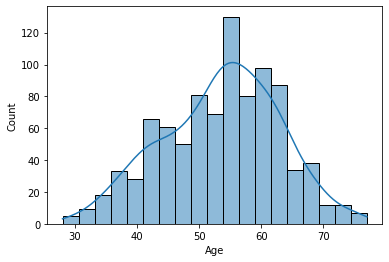

In [20]:
sns.histplot(df['Age'] , kde = True)

# 4.Data Visualization

## Gender Distribution 

In [23]:
df['HeartDisease'].value_counts()

1    508
0    410
Name: HeartDisease, dtype: int64

### Countplot

C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Sex', ylabel='count'>

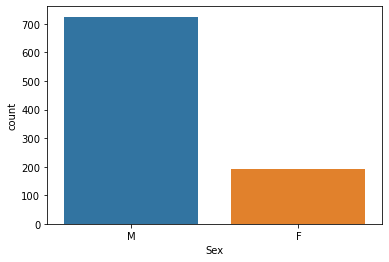

In [24]:
sns.countplot(df['Sex'])

In [25]:
label = df['Sex'].value_counts().index

In [26]:
label

Index(['M', 'F'], dtype='object')

In [27]:
count = df['Sex'].value_counts().values

In [28]:
count

array([725, 193], dtype=int64)

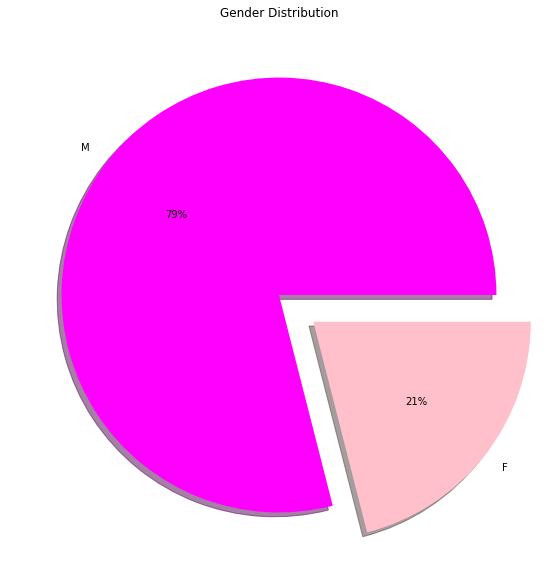

In [29]:
plt.figure(figsize = (20 , 10))
explode = (0,0.2)
colors =['magenta','pink']
plt.pie(count , 
        labels = label ,
       autopct='%1.0f%%' ,
       explode = explode,
       shadow = True,
       colors = colors)
plt.title('Gender Distribution')
plt.show()

## ChestPainType distribution

In [30]:
df['ChestPainType'].value_counts()

ASY    496
NAP    203
ATA    173
TA      46
Name: ChestPainType, dtype: int64

### Countplot

C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='ChestPainType', ylabel='count'>

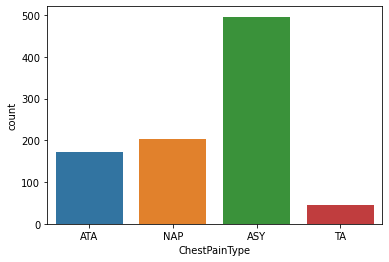

In [31]:
sns.countplot(df['ChestPainType'])

### Pie Chart

In [32]:
label = df['ChestPainType'].value_counts().index

In [33]:
label

Index(['ASY', 'NAP', 'ATA', 'TA'], dtype='object')

In [34]:
count = df['ChestPainType'].value_counts().values

In [35]:
count

array([496, 203, 173,  46], dtype=int64)

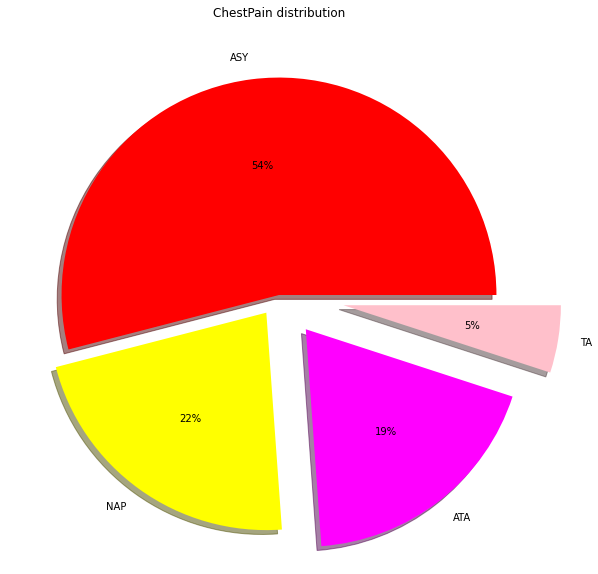

In [36]:
plt.figure(figsize = (20,10))
explode = (0,0.1,0.2,0.3)
color = ['red','yellow' ,'magenta','pink']
plt.pie(count , labels = label , explode = explode , colors = color  , autopct = '%1.0f%%' , shadow = True)
plt.title('ChestPain distribution')
plt.show()

## FastingBs Distribution

### count of categories

In [37]:
df['FastingBS'].value_counts()

0    704
1    214
Name: FastingBS, dtype: int64

### countplot  of  FastingBs

C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='FastingBS', ylabel='count'>

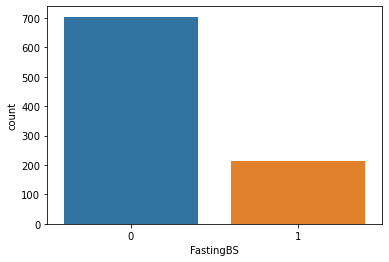

In [38]:
sns.countplot(df['FastingBS'])

### pie plot of FastingBS

In [39]:
label = df['FastingBS'].value_counts().index

In [40]:
label 

Int64Index([0, 1], dtype='int64')

In [41]:
count = df['FastingBS'].value_counts().values

In [42]:
count

array([704, 214], dtype=int64)

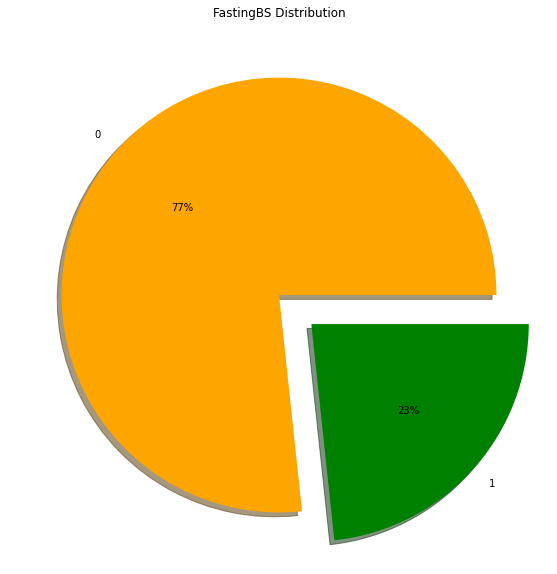

In [43]:
plt.figure(figsize = (20 ,10))
explode = (0, 0.2)
colors = ['orange' , 'green']
plt.pie(count , labels = label , explode = explode , colors =  colors  , autopct = '%1.0f%%' , shadow = True)
plt.title('FastingBS Distribution')
plt.show()

## RestingECG Distribution

### count of categories of RestingECG

In [44]:
df['RestingECG'].value_counts()

Normal    552
LVH       188
ST        178
Name: RestingECG, dtype: int64

### Countplot of categories of restingECG

C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='RestingECG', ylabel='count'>

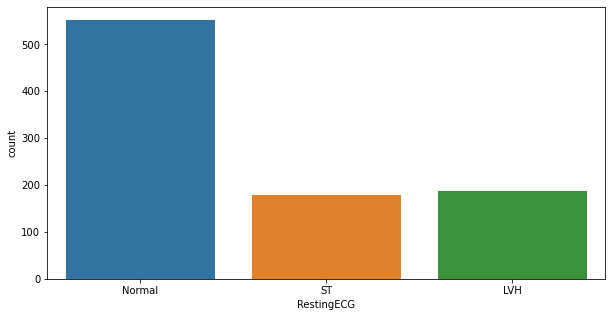

In [45]:
plt.figure(figsize = (10 , 5))
sns.countplot(df['RestingECG'])

### Pieplot of RestingECG

In [46]:
label = df['RestingECG'].value_counts().index

In [47]:
label

Index(['Normal', 'LVH', 'ST'], dtype='object')

In [48]:
value = df['RestingECG'].value_counts().values

In [49]:
value

array([552, 188, 178], dtype=int64)

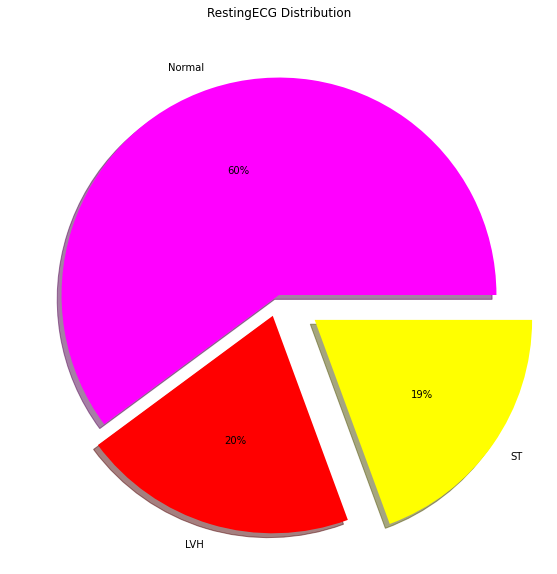

In [50]:
plt.figure(figsize = (20 , 10))
explode = [0,0.1,0.2]
colors = ['magenta' , 'red' , 'yellow']
plt.pie(value , labels = label , explode = explode ,colors = colors , autopct = '%1.0f%%' , shadow = True )
plt.title('RestingECG Distribution')
plt.show()

## ExcerciseAngina Distribution

### Count of ExcerciseAngina

In [51]:
df['ExerciseAngina'].value_counts()

N    547
Y    371
Name: ExerciseAngina, dtype: int64

### Countplot

C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='ExerciseAngina', ylabel='count'>

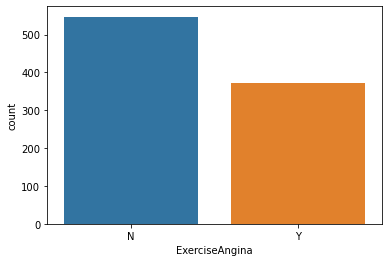

In [52]:
sns.countplot(df['ExerciseAngina'])

### Pie plot of ExerciseAngina

In [53]:
label = df['ExerciseAngina'].value_counts().index

In [54]:
label 

Index(['N', 'Y'], dtype='object')

In [55]:
value = df['ExerciseAngina'].value_counts().values

In [56]:
value

array([547, 371], dtype=int64)

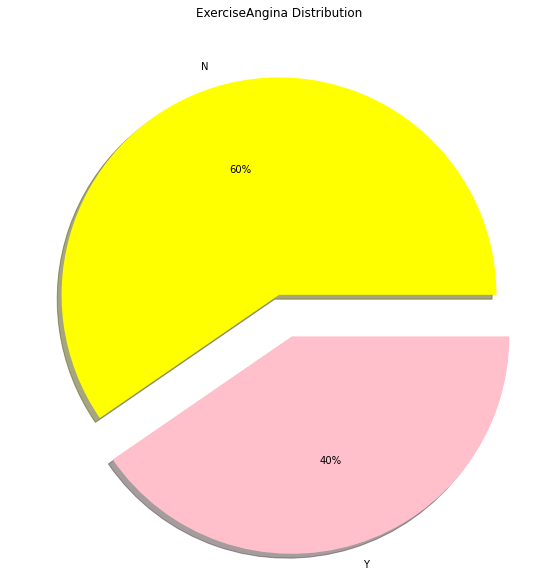

In [57]:
plt.figure(figsize = (20 , 10))
explode = (0,0.2)
colors = ['Yellow' , 'pink']
plt.pie(value , labels = label, explode = explode , colors = colors , autopct = '%1.0f%%' , shadow = True)
plt.title('ExerciseAngina Distribution')
plt.show()

## ST_Slope Distribution

### Count of categories of ST_Slope 

In [58]:
df['ST_Slope'].value_counts()

Flat    460
Up      395
Down     63
Name: ST_Slope, dtype: int64

### Countplot

C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='ST_Slope', ylabel='count'>

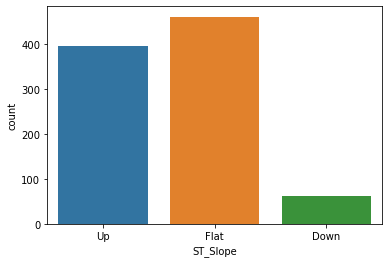

In [59]:
sns.countplot(df['ST_Slope'])

### Pie plot of ST_Slope 

In [60]:
label = df['ST_Slope'].value_counts().index

In [61]:
label 

Index(['Flat', 'Up', 'Down'], dtype='object')

In [62]:
value = df['ST_Slope'].value_counts().values

In [63]:
value

array([460, 395,  63], dtype=int64)

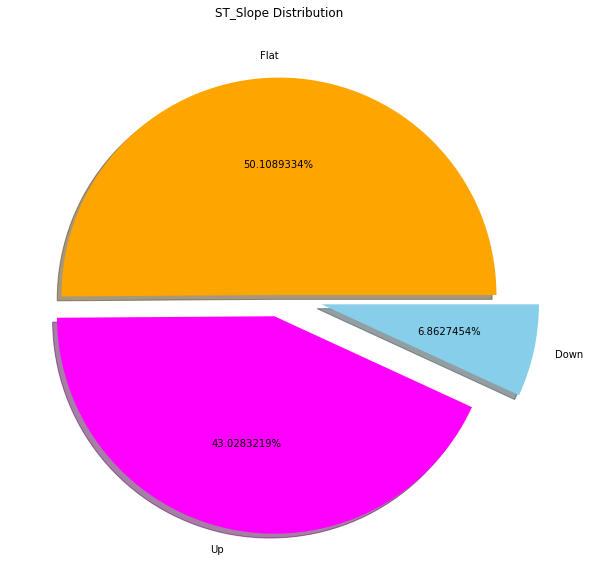

In [64]:
plt.figure(figsize = (20, 10))
explode = (0,0.1,0.2)
colors = ['orange' ,'magenta' , 'skyblue']
plt.pie(value , labels = label , explode = explode , colors = colors , autopct = '%1.7f%%' , shadow = True)
plt.title('ST_Slope Distribution')
plt.show()

## HeartDisease Distribution

In [65]:
df

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,M,TA,110,264,0,Normal,132,N,1.2,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.4,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.2,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.0,Flat,1


### Count of HeartDisease

In [66]:
df['HeartDisease'].value_counts()

1    508
0    410
Name: HeartDisease, dtype: int64

### Countplot of HearDisease

C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
No handles with labels found to put in legend.


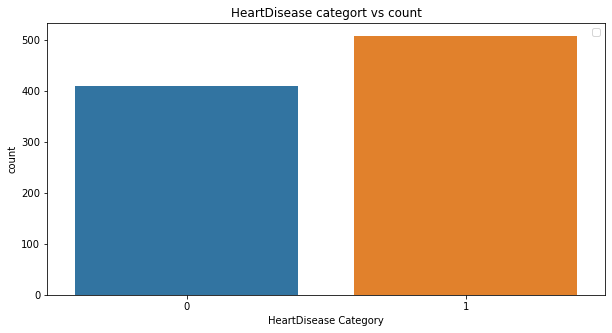

In [67]:
plt.figure(figsize = (10, 5))
sns.countplot(df['HeartDisease'])
plt.xlabel('HeartDisease Category')
plt.title('HeartDisease categort vs count')
plt.legend()

### Pie plot of HeartDisease

In [68]:
label = df['HeartDisease'].value_counts().index

In [69]:
label

Int64Index([1, 0], dtype='int64')

In [70]:
value = df['HeartDisease'].value_counts().values

In [71]:
value

array([508, 410], dtype=int64)

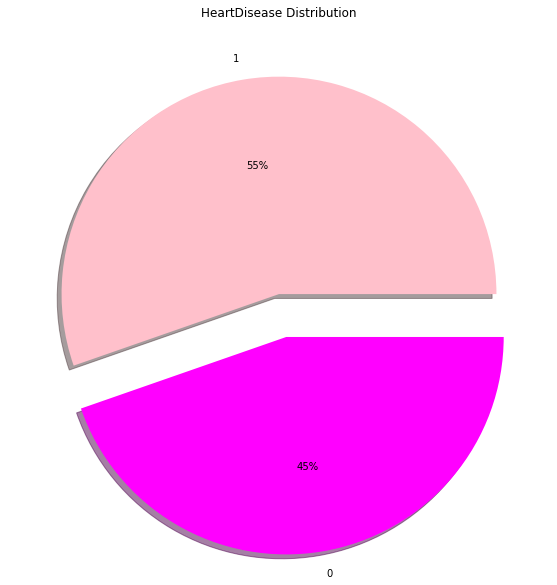

In [72]:

plt.figure(figsize = (20, 10))
explode = (0, 0.2)
color = ['Pink' ,'magenta']
plt.pie(value , labels = label , explode = explode , colors = color , autopct = '%1.0f%%' , shadow = True)
plt.title('HeartDisease Distribution')
plt.show()

In [73]:
import plotly.express as px
import plotly.graph_objects as go

fig =  px.scatter(df , x = df['Age'],y = df['Cholesterol'] ,  color = df['HeartDisease'] , facet_col = df['FastingBS'] , facet_row = df['Sex'],
width=950, height=800,title="HeartDisease Data")

fig.update_layout(
                    plot_bgcolor= "#dcedc1",
                    paper_bgcolor="#FFFDE7",
                 )
                  
fig.show()

In [74]:
cat = ['Sex', 'ChestPainType','FastingBS','RestingECG',
                          'ExerciseAngina',  'ST_Slope','HeartDisease']
num = ['Age','RestingBP','Cholesterol','MaxHR','Oldpeak']

In [75]:
for i in df.columns:
    print(i)

Age
Sex
ChestPainType
RestingBP
Cholesterol
FastingBS
RestingECG
MaxHR
ExerciseAngina
Oldpeak
ST_Slope
HeartDisease


### Data Visualization by countplot from one column to all columns ( regression to classification)
#####  X = regression and y = classification

In [76]:
cat

['Sex',
 'ChestPainType',
 'FastingBS',
 'RestingECG',
 'ExerciseAngina',
 'ST_Slope',
 'HeartDisease']

#### countplot on  HeartDisease with all other features

Sex


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



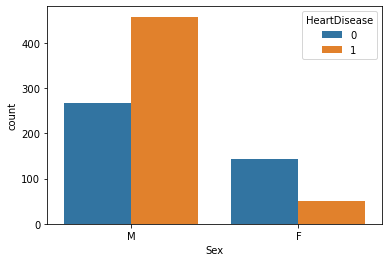

ChestPainType


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



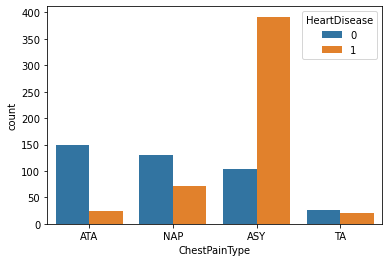

FastingBS


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



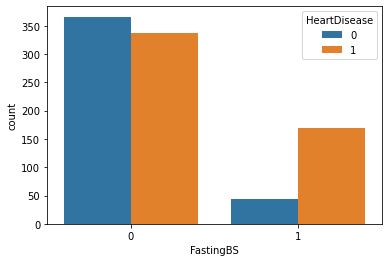

RestingECG


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



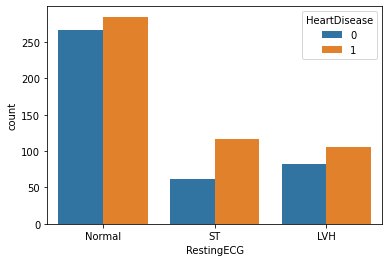

ExerciseAngina


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



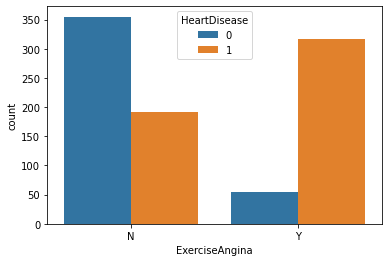

ST_Slope


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



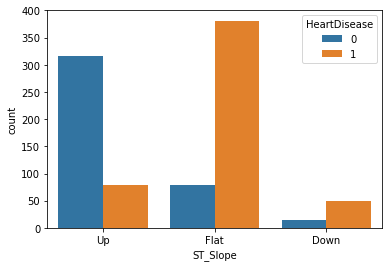

HeartDisease


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



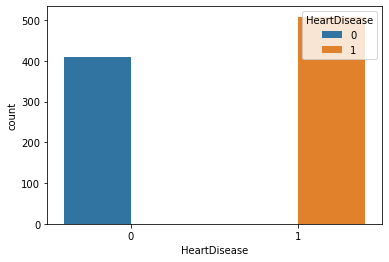

In [77]:
for i in cat:
    print(i)
    sns.countplot(df[i] , hue = df['HeartDisease'])
    plt.show()

#### countplot on sex  with all other features

Sex


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



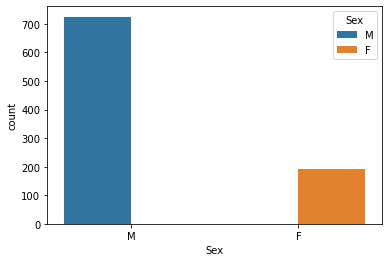

ChestPainType


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



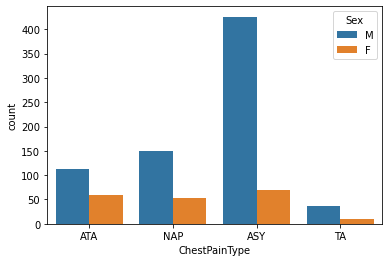

FastingBS


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



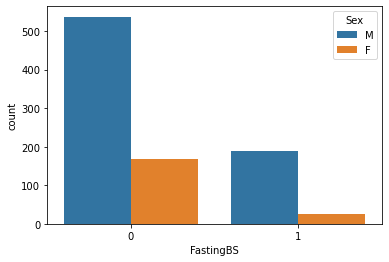

RestingECG


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



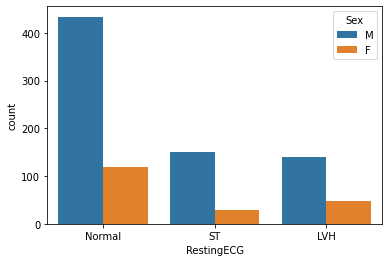

ExerciseAngina


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



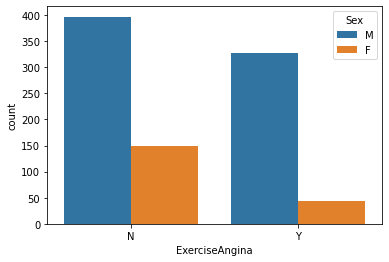

ST_Slope


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



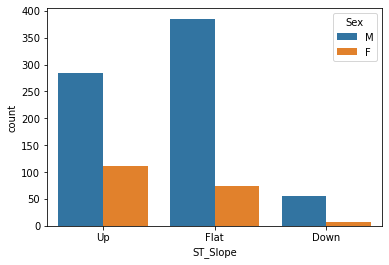

HeartDisease


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



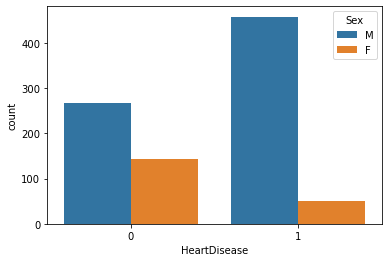

In [78]:

for i in cat:
    print(i)
    sns.countplot(  df[i] , hue = df['Sex'])
    plt.show()

#### Countplot on ChestPain to all other features

Sex


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



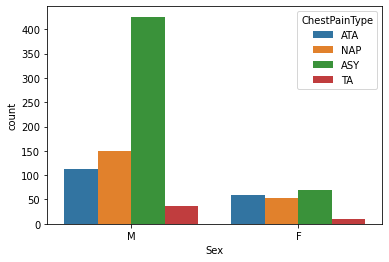

ChestPainType


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



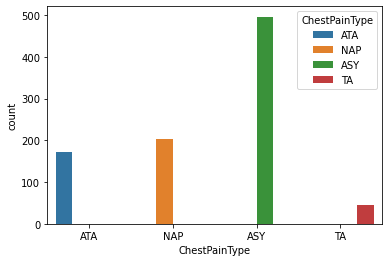

FastingBS


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



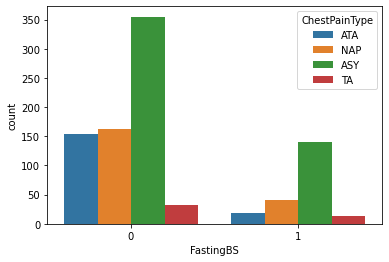

RestingECG


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



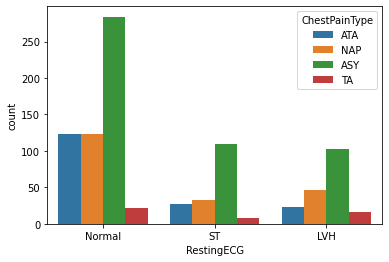

ExerciseAngina


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



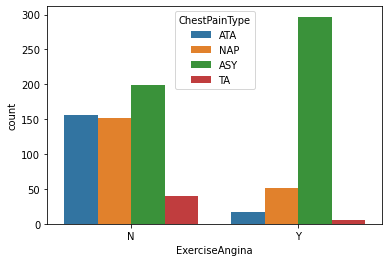

ST_Slope


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



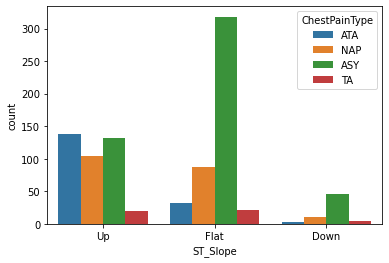

HeartDisease


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



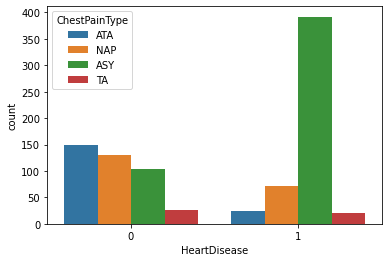

In [79]:
for i in cat:
    print(i)
    sns.countplot(df[i] , hue =  df['ChestPainType'])
    plt.show()

### Countplot RestingECG with all other Features

Sex


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



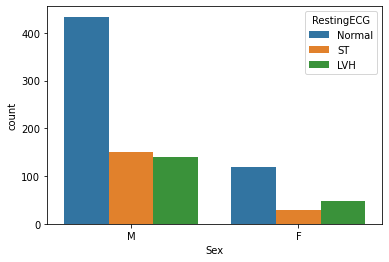

ChestPainType


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



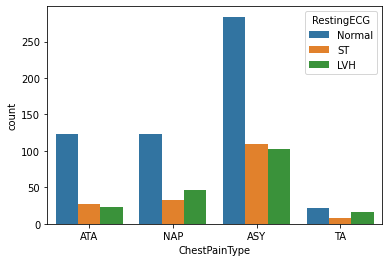

FastingBS


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



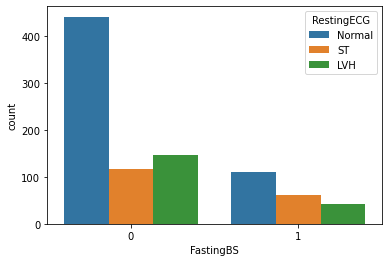

RestingECG


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



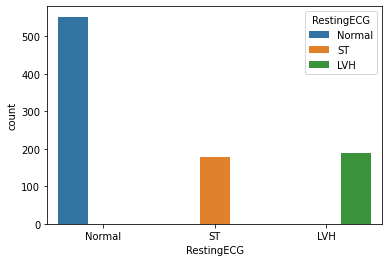

ExerciseAngina


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



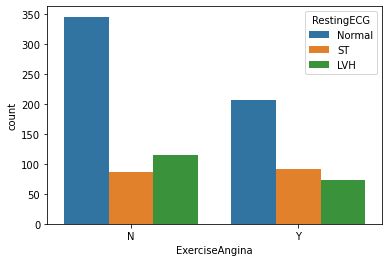

ST_Slope


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



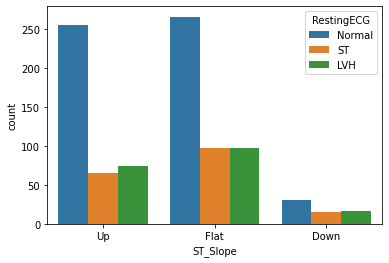

HeartDisease


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



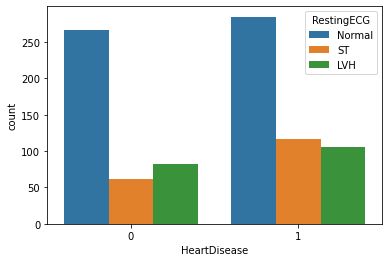

In [80]:
for i in cat :
    print(i)
    sns.countplot(df[i] , hue = df['RestingECG'])
    plt.show()

### Countplot on ExerciseAngina with all other features

Sex


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



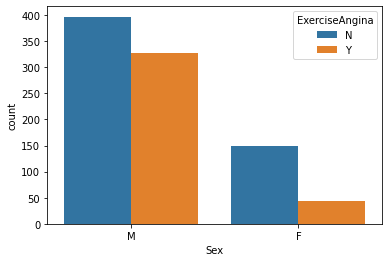

ChestPainType


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



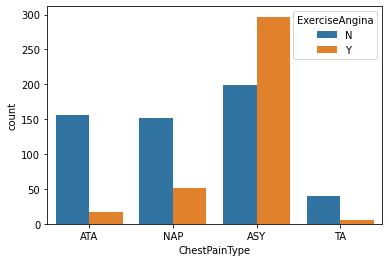

FastingBS


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



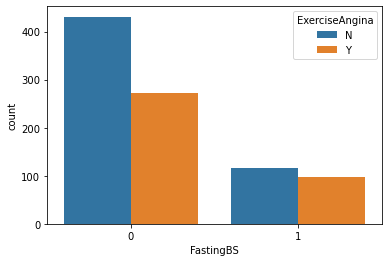

RestingECG


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



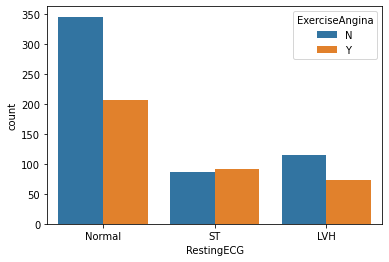

ExerciseAngina


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



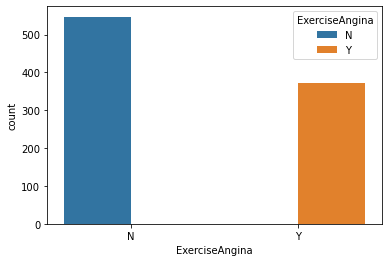

ST_Slope


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



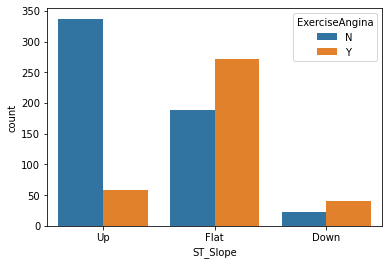

HeartDisease


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



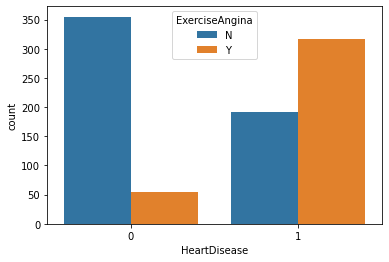

In [81]:
for i in cat:
    print(i)
    sns.countplot(df[i] ,hue = df['ExerciseAngina'])
    plt.show()

### Countplot on ST_slope with all other features

Sex


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



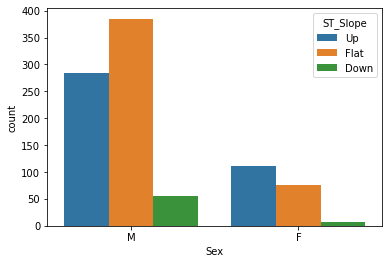

ChestPainType


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



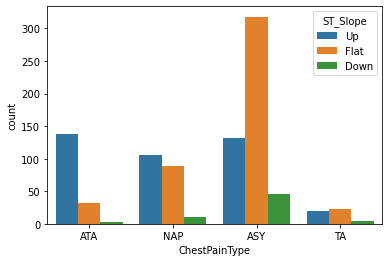

FastingBS


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



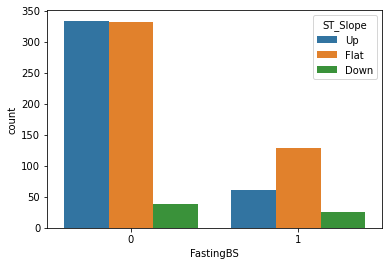

RestingECG


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



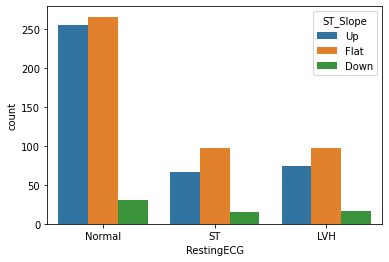

ExerciseAngina


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



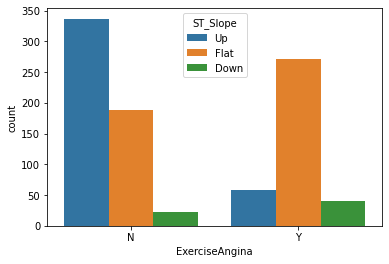

ST_Slope


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



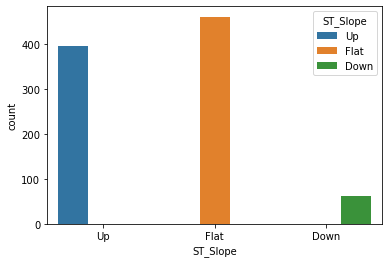

HeartDisease


C:\Users\Pritam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



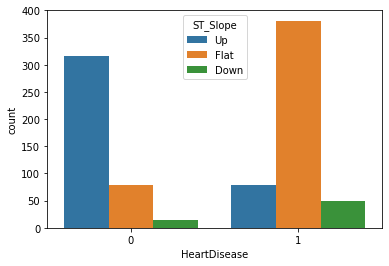

In [82]:
for i in cat :
    print(i)
    sns.countplot(df[i] , hue = df['ST_Slope'])
    plt.show()

## Pairplot : To plot relation in pairwise

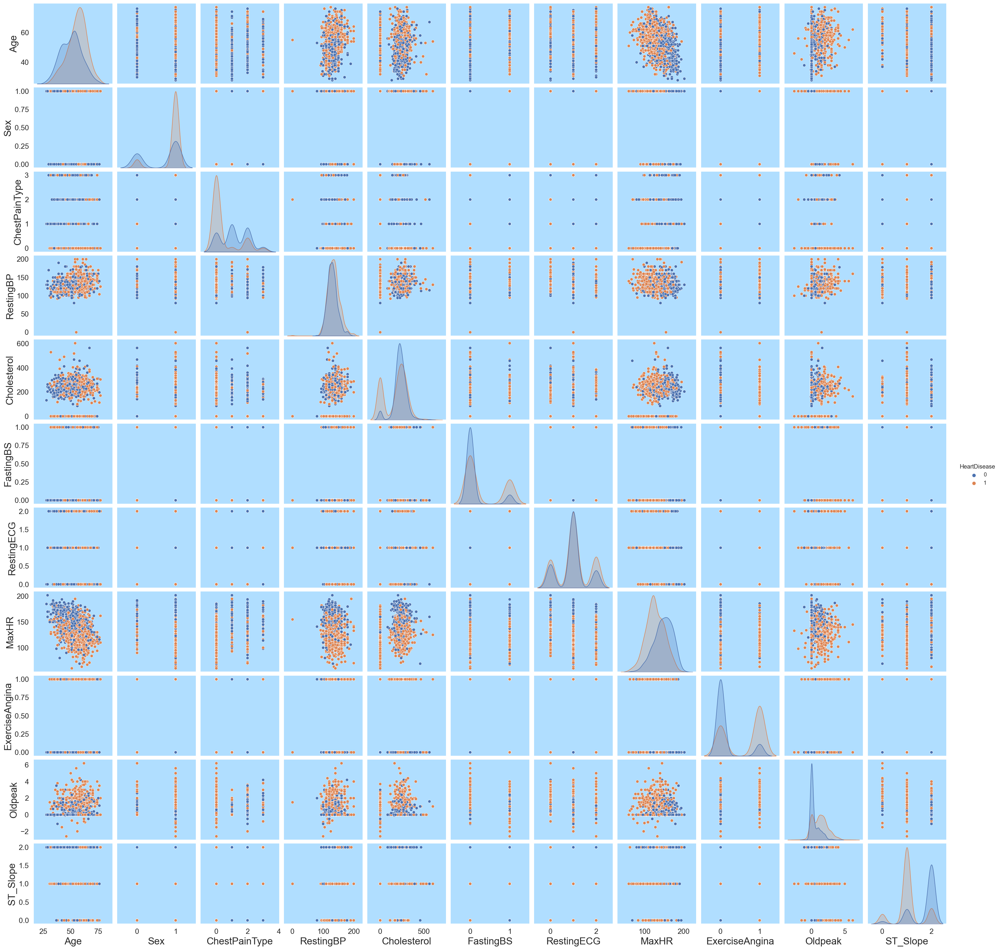

In [302]:
sns.pairplot(df , hue = 'HeartDisease')

## Histogram : To show distribution of dataset

array([[<AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Sex'}>,
        <AxesSubplot:title={'center':'ChestPainType'}>],
       [<AxesSubplot:title={'center':'RestingBP'}>,
        <AxesSubplot:title={'center':'Cholesterol'}>,
        <AxesSubplot:title={'center':'FastingBS'}>],
       [<AxesSubplot:title={'center':'RestingECG'}>,
        <AxesSubplot:title={'center':'MaxHR'}>,
        <AxesSubplot:title={'center':'ExerciseAngina'}>],
       [<AxesSubplot:title={'center':'Oldpeak'}>,
        <AxesSubplot:title={'center':'ST_Slope'}>,
        <AxesSubplot:title={'center':'HeartDisease'}>]], dtype=object)

<Figure size 1200x1200 with 0 Axes>

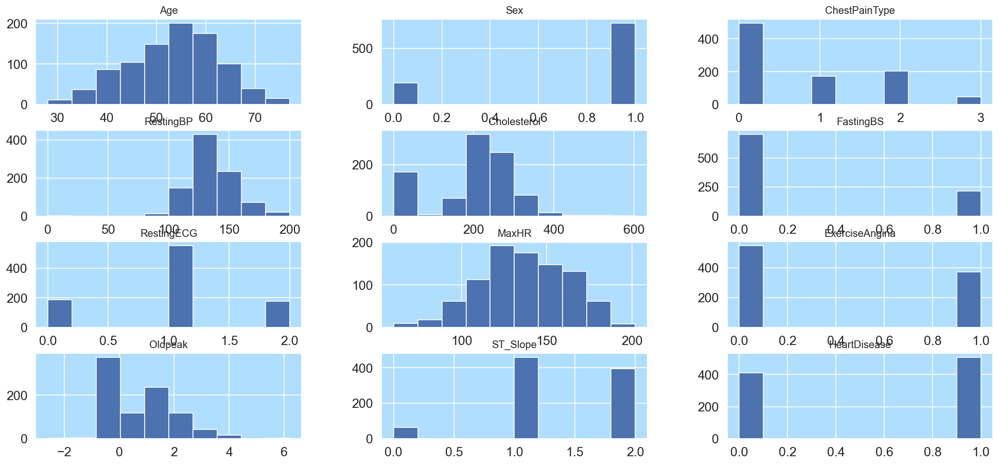

In [305]:
plt.figure(figsize = (10, 10))
df.hist()

### Boxplot : To Show Outliers

<AxesSubplot:>

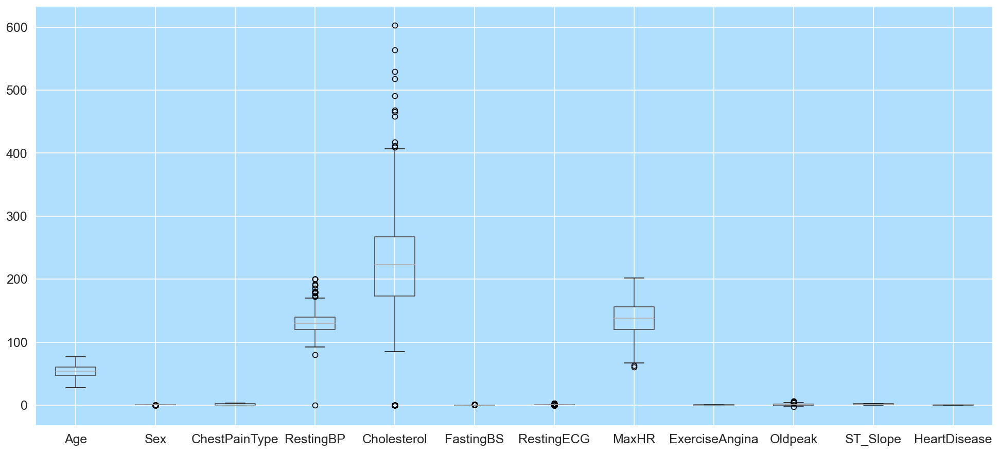

In [287]:
df.boxplot()

## ViolinPlot : same role as box and whisker

### ViolinPlot on  Age column

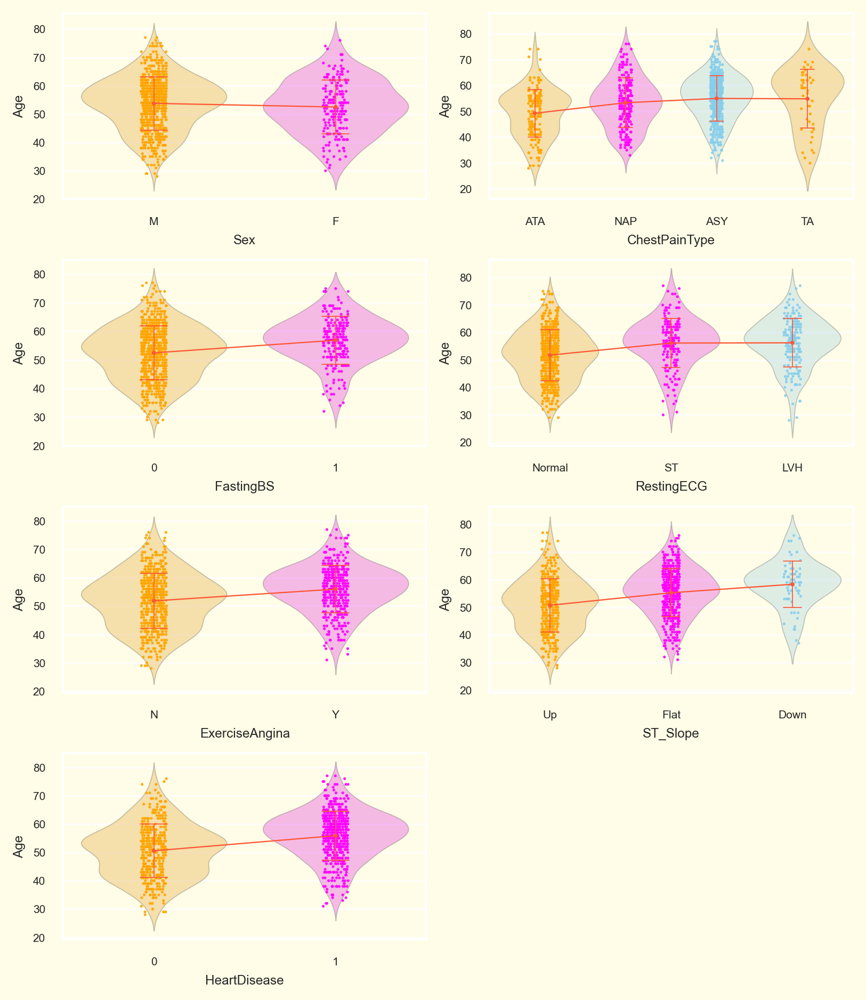

In [83]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)
fig, ax = plt.subplots(4, 2, figsize = (6.5, 7.5))
for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    
    sns.violinplot(ax = axes, x = df[column], 
                   y = df['Age'],
                   scale = 'width', linewidth = 0.5, 
                   palette = colors, inner = None)
    
    plt.setp(axes.collections, alpha = 0.3)
    
    sns.stripplot(ax = axes, x = df[column], 
                  y = df['Age'],
                  palette = colors, alpha = 0.9, 
                  s = 1.5, jitter = 0.07)
    sns.pointplot(ax = axes, x = df[column],
                  y = df['Age'],
                  color = '#ff5736', scale = 0.25,
                  estimator = np.mean, ci = 'sd',
                  errwidth = 0.5, capsize = 0.15, join = True)
    
    plt.setp(axes.lines, zorder = 100)
    plt.setp(axes.collections, zorder = 100)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

### violinPlot in RestingBP column

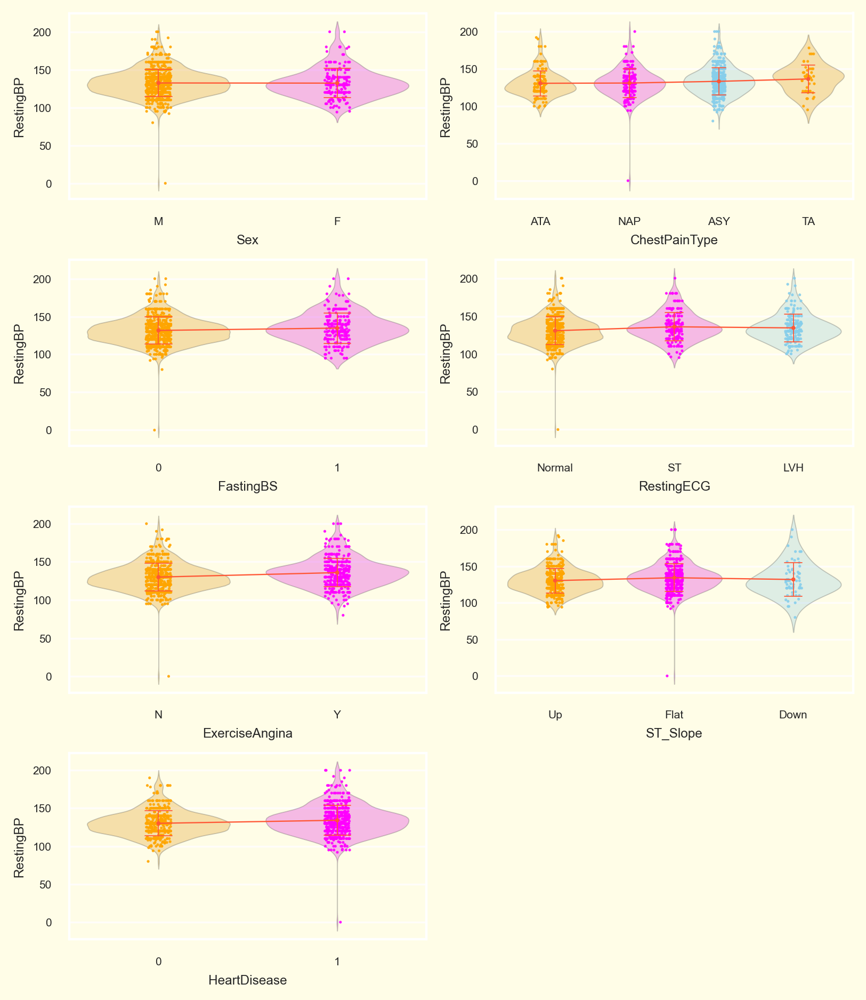

In [84]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)
fig, ax = plt.subplots(4, 2, figsize = (6.5, 7.5))
for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    
    sns.violinplot(ax = axes, x = df[column], 
                   y = df['RestingBP'],
                   scale = 'width', linewidth = 0.5, 
                   palette = colors, inner = None)
    
    plt.setp(axes.collections, alpha = 0.3)
    
    sns.stripplot(ax = axes, x = df[column], 
                  y = df['RestingBP'],
                  palette = colors, alpha = 0.9, 
                  s = 1.5, jitter = 0.07)
    sns.pointplot(ax = axes, x = df[column],
                  y = df['RestingBP'],
                  color = '#ff5736', scale = 0.25,
                  estimator = np.mean, ci = 'sd',
                  errwidth = 0.5, capsize = 0.15, join = True)
    
    plt.setp(axes.lines, zorder = 100)
    plt.setp(axes.collections, zorder = 100)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

### ViolinPlot on Cholesterol

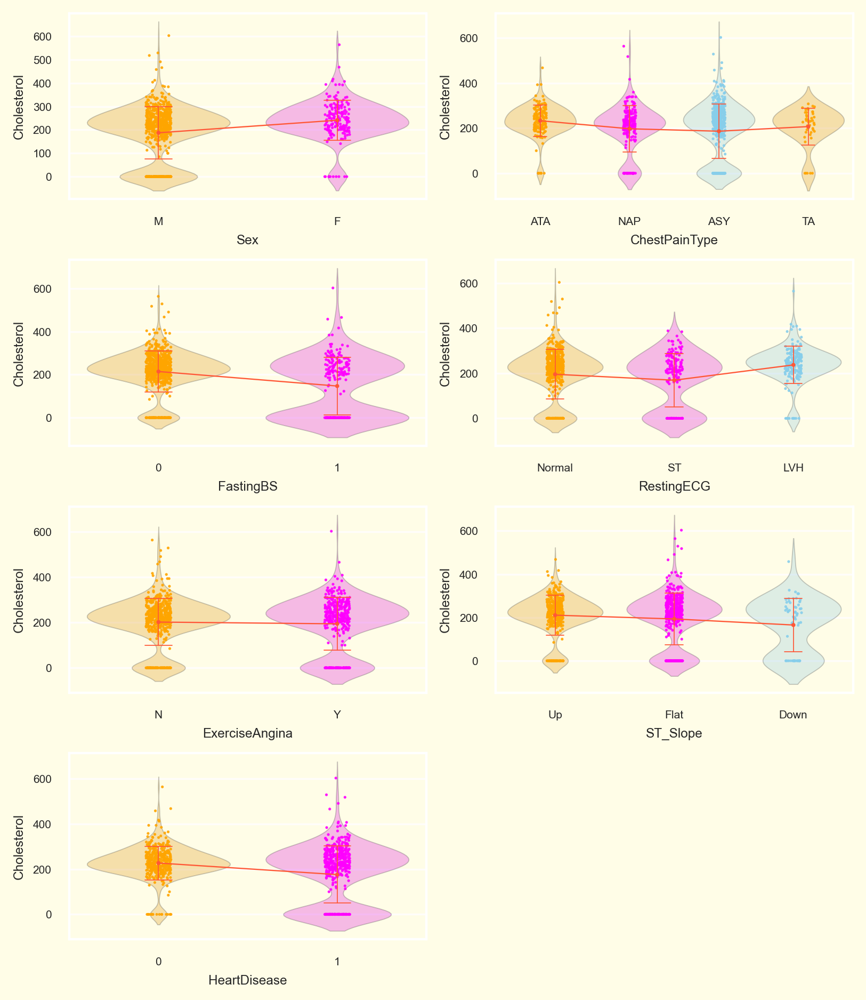

In [85]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)
fig, ax = plt.subplots(4, 2, figsize = (6.5, 7.5))
for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    
    sns.violinplot(ax = axes, x = df[column], 
                   y = df['Cholesterol'],
                   scale = 'width', linewidth = 0.5, 
                   palette = colors, inner = None)
    
    plt.setp(axes.collections, alpha = 0.3)
    
    sns.stripplot(ax = axes, x = df[column], 
                  y = df['Cholesterol'],
                  palette = colors, alpha = 0.9, 
                  s = 1.5, jitter = 0.07)
    sns.pointplot(ax = axes, x = df[column],
                  y = df['Cholesterol'],
                  color = '#ff5736', scale = 0.25,
                  estimator = np.mean, ci = 'sd',
                  errwidth = 0.5, capsize = 0.15, join = True)
    
    plt.setp(axes.lines, zorder = 100)
    plt.setp(axes.collections, zorder = 100)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

### Countplot on MaxHR

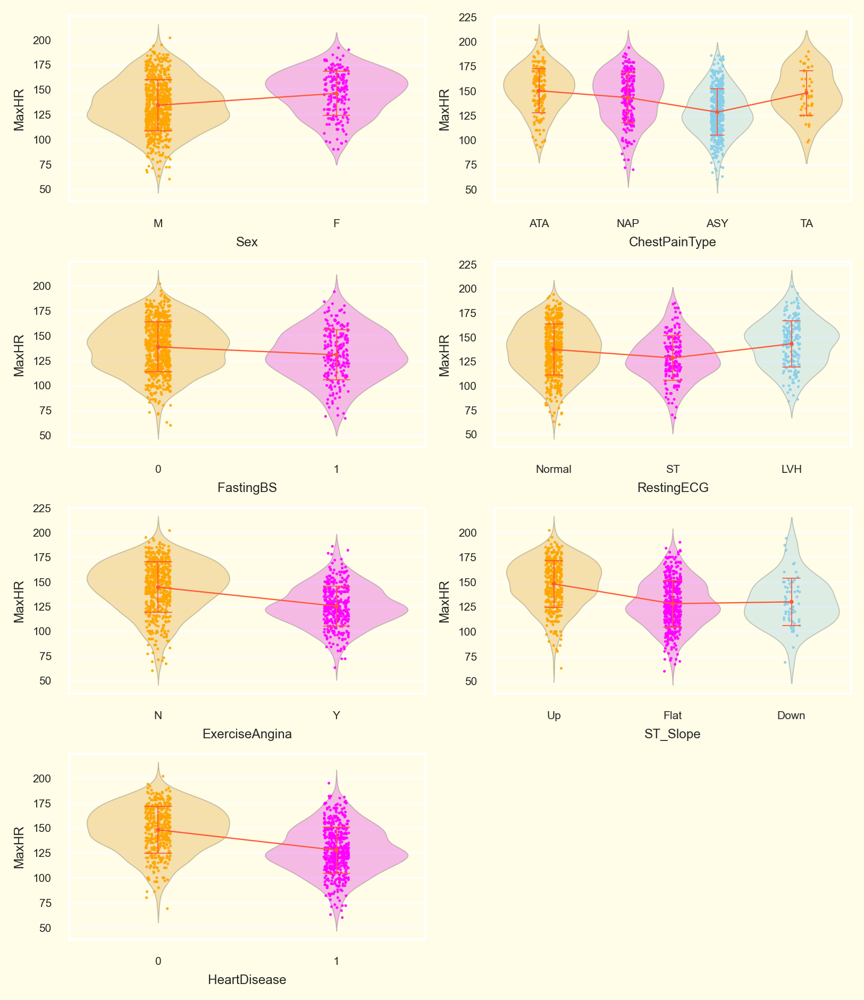

In [86]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)
fig, ax = plt.subplots(4, 2, figsize = (6.5, 7.5))
for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    
    sns.violinplot(ax = axes, x = df[column], 
                   y = df['MaxHR'],
                   scale = 'width', linewidth = 0.5, 
                   palette = colors, inner = None)
    
    plt.setp(axes.collections, alpha = 0.3)
    
    sns.stripplot(ax = axes, x = df[column], 
                  y = df['MaxHR'],
                  palette = colors, alpha = 0.9, 
                  s = 1.5, jitter = 0.07)
    sns.pointplot(ax = axes, x = df[column],
                  y = df['MaxHR'],
                  color = '#ff5736', scale = 0.25,
                  estimator = np.mean, ci = 'sd',
                  errwidth = 0.5, capsize = 0.15, join = True)
    
    plt.setp(axes.lines, zorder = 100)
    plt.setp(axes.collections, zorder = 100)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

### Countplot on OldPeak

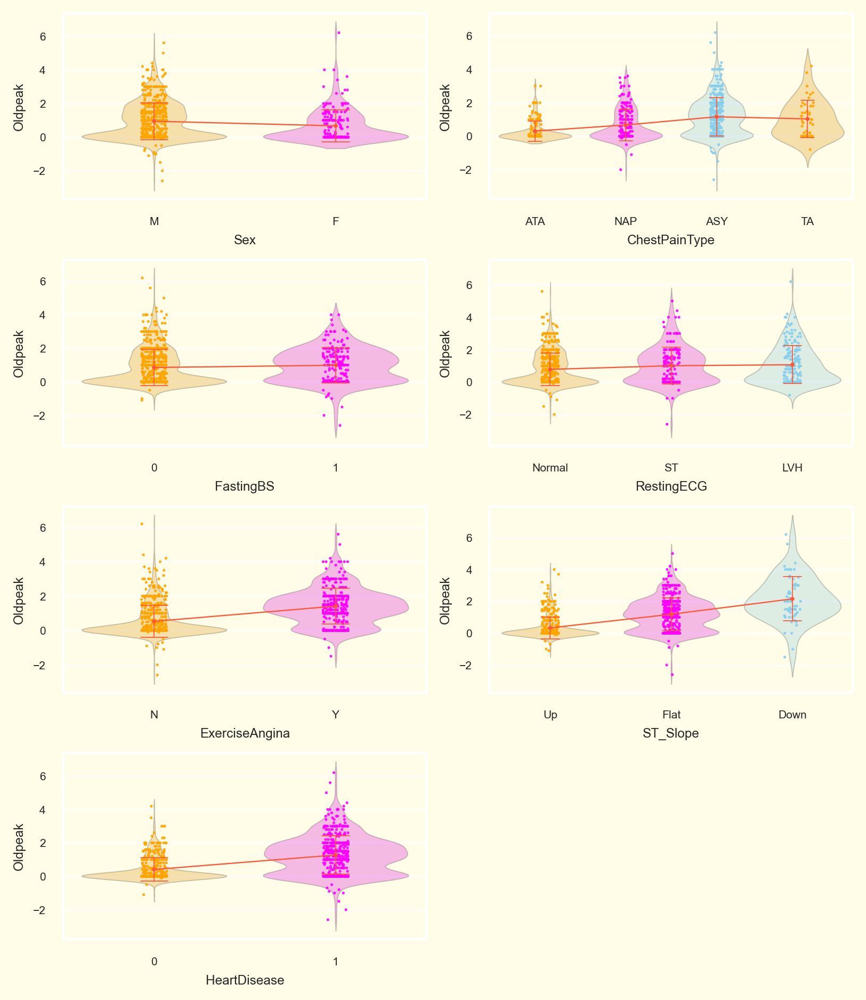

In [87]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)
fig, ax = plt.subplots(4, 2, figsize = (6.5, 7.5))
for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    
    sns.violinplot(ax = axes, x = df[column], 
                   y = df['Oldpeak'],
                   scale = 'width', linewidth = 0.5, 
                   palette = colors, inner = None)
    
    plt.setp(axes.collections, alpha = 0.3)
    
    sns.stripplot(ax = axes, x = df[column], 
                  y = df['Oldpeak'],
                  palette = colors, alpha = 0.9, 
                  s = 1.5, jitter = 0.07)
    sns.pointplot(ax = axes, x = df[column],
                  y = df['Oldpeak'],
                  color = '#ff5736', scale = 0.25,
                  estimator = np.mean, ci = 'sd',
                  errwidth = 0.5, capsize = 0.15, join = True)
    
    plt.setp(axes.lines, zorder = 100)
    plt.setp(axes.collections, zorder = 100)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

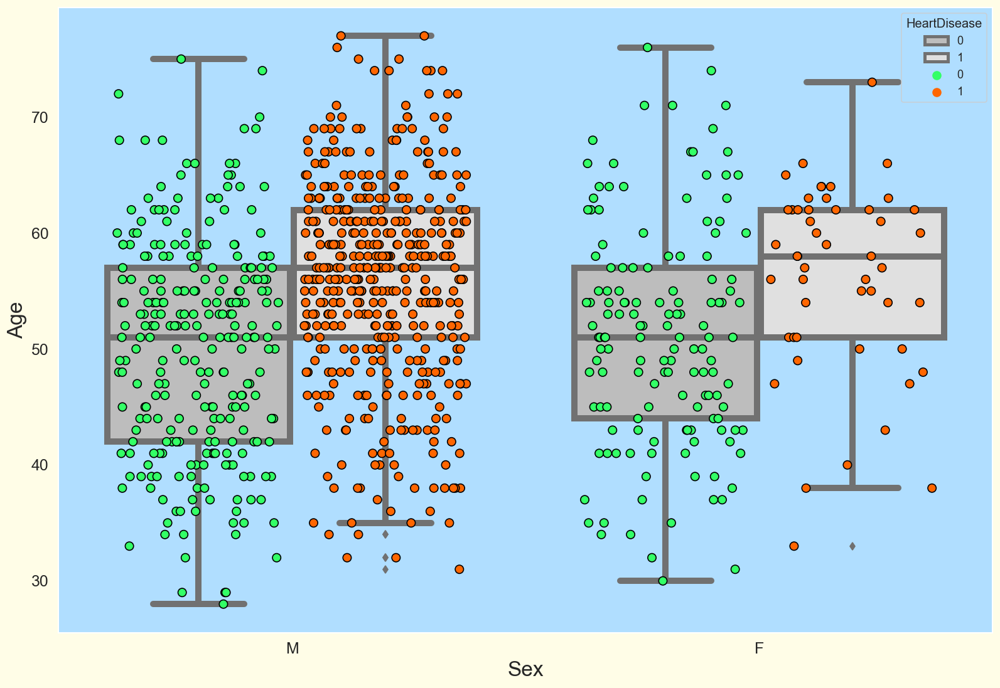

In [104]:
plt.figure(figsize=(16,11))
sns.set(rc={"axes.facecolor":"#b0deff","axes.grid":False,
            'xtick.labelsize':15,'ytick.labelsize':15,
            'axes.labelsize':20,'figure.figsize':(20.0, 9.0)})
params = dict(data=df ,x = df.Sex ,y = df.Age ,hue=df.HeartDisease,dodge=True)
sns.stripplot(**params , size=8,jitter=0.35,palette=['#33FF66','#FF6600'],edgecolor='black',linewidth=1)
sns.boxplot(**params ,palette=['#BDBDBD','#E0E0E0'],linewidth=6)
plt.show()

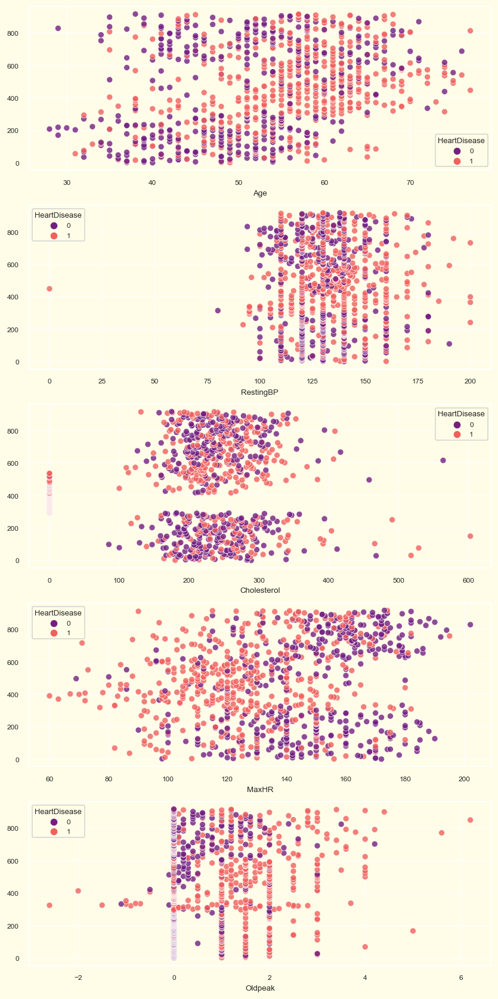

In [91]:
sns.set_theme(rc = {'figure.dpi': 120, 'axes.labelsize': 8, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.65)

fig, ax = plt.subplots(5, 1, figsize = (7, 14))

for indx, (column, axes) in list(enumerate(list(zip(num, ax.flatten())))):
    
    sns.scatterplot(ax = axes, y = df[column].index, x = df[column], 
                    hue = df['HeartDisease'], palette = 'magma', alpha = 0.8)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Correleation Matrix')

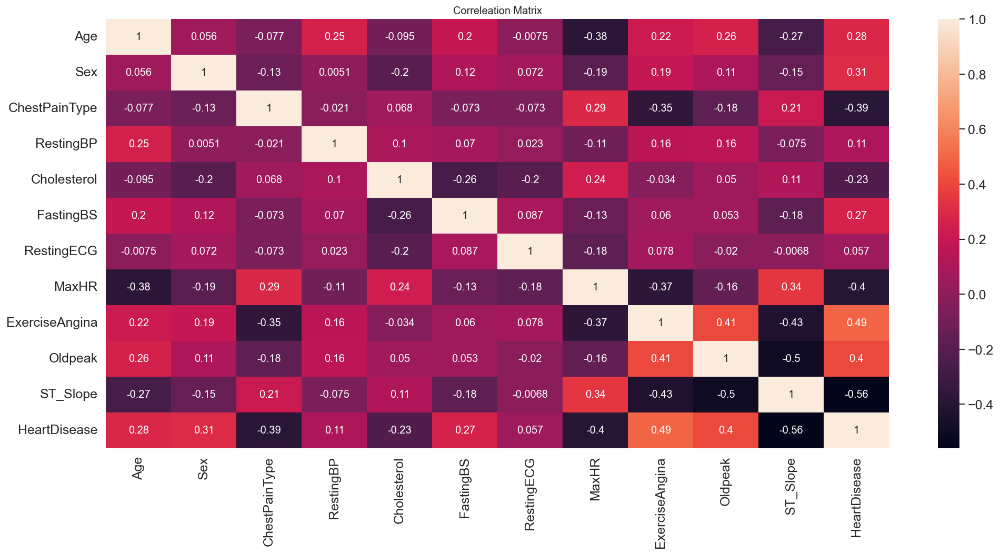

In [284]:
sns.heatmap(df.corr() , annot = True)
plt.title('Correleation Matrix')

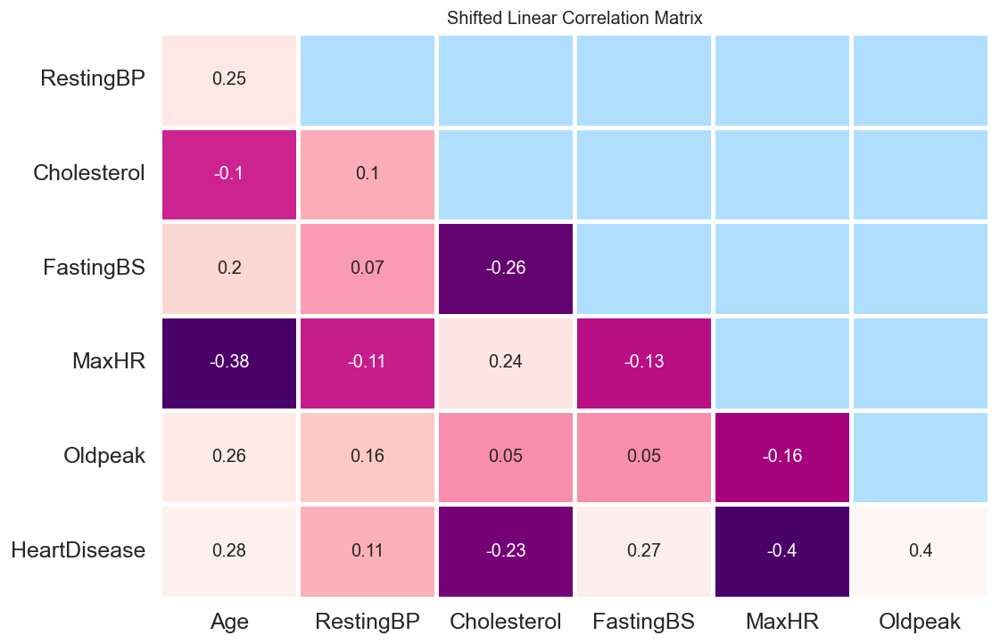

In [107]:
def corrMat(df,id=False):
    
    corr_mat = df.corr().round(2)
    f, ax = plt.subplots(figsize=(10,7))
    mask = np.triu(np.ones_like(corr_mat, dtype=bool))
    mask = mask[1:,:-1]
    corr = corr_mat.iloc[1:,:-1].copy()
    sns.heatmap(corr,mask=mask,vmin=-0.3,vmax=0.3,center=0, 
                cmap='RdPu_r',square=False,lw=2,annot=True,cbar=False)
#     bottom, top = ax.get_ylim() 
#     ax.set_ylim(bottom + 0.5, top - 0.5) 
    ax.set_title('Shifted Linear Correlation Matrix')
    
corrMat(df)

In [109]:
df2 = df.groupby('Sex').agg({'Age' : 'mean', "ChestPainType":'count','RestingBP':'mean','Cholesterol':'mean',
                            'FastingBS':'sum','RestingECG':'count','MaxHR':'mean','ExerciseAngina':'count','Oldpeak':'mean',
                            'ST_Slope':'count','HeartDisease':'sum'})

In [110]:
px.bar(data_frame=df2, barmode='group',
       title = "<b>Gender wise Analyzing</b>",template="plotly_dark")

# 5.Data Preprocessing

In [115]:
df.head(1)

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0


### Encoding

In [149]:
from sklearn.preprocessing import LabelEncoder

In [150]:
label = LabelEncoder()

In [156]:
df['Sex'] = label.fit_transform(df['Sex'])
df['ChestPainType'] = label.fit_transform(df['ChestPainType'])
df['RestingECG'] = label.fit_transform(df['RestingECG'])
df['ExerciseAngina'] = label.fit_transform(df['ExerciseAngina'])
df['ST_Slope'] = label.fit_transform(df['ST_Slope'])

In [157]:
df

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,1,1,140,289,0,1,172,0,0.0,2,0
1,49,0,2,160,180,0,1,156,0,1.0,1,1
2,37,1,1,130,283,0,2,98,0,0.0,2,0
3,48,0,0,138,214,0,1,108,1,1.5,1,1
4,54,1,2,150,195,0,1,122,0,0.0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,1,3,110,264,0,1,132,0,1.2,1,1
914,68,1,0,144,193,1,1,141,0,3.4,1,1
915,57,1,0,130,131,0,1,115,1,1.2,1,1
916,57,0,1,130,236,0,0,174,0,0.0,1,1


### Data split into dependent and independent variable

In [160]:
x = df.drop(labels = ['HeartDisease'] , axis = 1 )

In [161]:
y = df.iloc[:,-1]

In [162]:
x.head(2)

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope
0,40,1,1,140,289,0,1,172,0,0.0,2
1,49,0,2,160,180,0,1,156,0,1.0,1


In [163]:
y.head(2)

0    0
1    1
Name: HeartDisease, dtype: int64

### Data split into train and  test 

In [164]:
from sklearn.model_selection import train_test_split
x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = 0.2 , random_state = 42)

## Feature Scaling

In [165]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.fit_transform(x_test)

In [167]:
x_train

array([[-1.24506731,  0.54060477,  1.31674291, ..., -0.83846064,
        -0.09706109, -2.25746543],
       [-1.8862362 ,  0.54060477,  1.31674291, ..., -0.83846064,
        -0.83628643,  1.07985506],
       [ 0.25099346,  0.54060477, -0.80974619, ...,  1.19266183,
         0.08774524, -0.58880518],
       ...,
       [ 0.67843939,  0.54060477, -0.80974619, ...,  1.19266183,
         0.45735791,  1.07985506],
       [ 0.67843939,  0.54060477, -0.80974619, ...,  1.19266183,
        -0.83628643,  1.07985506],
       [-1.45879027, -1.84978019, -0.80974619, ..., -0.83846064,
         1.01177691, -0.58880518]])

In [168]:
y_train

795    0
25     0
84     1
10     0
344    1
      ..
106    0
270    0
860    1
435    0
102    1
Name: HeartDisease, Length: 734, dtype: int64

## Feature Selection

In [169]:
from sklearn.ensemble import ExtraTreesClassifier

In [170]:
model_f = ExtraTreesClassifier()

In [171]:
model_f.fit(x_train , y_train)

ExtraTreesClassifier()

In [172]:
model_f.feature_importances_

array([0.07413739, 0.05519489, 0.08040363, 0.06411385, 0.09548881,
       0.04189263, 0.03689076, 0.08649025, 0.16571806, 0.10769567,
       0.19197406])

In [173]:
feature_score_f = pd.DataFrame(model_f.feature_importances_ , columns = ['Score'])

In [175]:
feature = pd.DataFrame(df.columns , columns = ['Features'])

In [176]:
feature

,Features
0,Age
1,Sex
2,ChestPainType
3,RestingBP
4,Cholesterol
5,FastingBS
6,RestingECG
7,MaxHR
8,ExerciseAngina
9,Oldpeak


In [177]:
feature_importance_score = pd.concat([feature , feature_score_f] , axis = 1)

In [178]:
feature_importance_score

,Features,Score
0,Age,0.074137
1,Sex,0.055195
2,ChestPainType,0.080404
3,RestingBP,0.064114
4,Cholesterol,0.095489
5,FastingBS,0.041893
6,RestingECG,0.036891
7,MaxHR,0.086490
8,ExerciseAngina,0.165718
9,Oldpeak,0.107696


In [181]:
feature_importance_score_nlarge = feature_importance_score.nlargest(11 , 'Score')

In [182]:
feature_importance_score_nlarge

,Features,Score
10,ST_Slope,0.191974
8,ExerciseAngina,0.165718
9,Oldpeak,0.107696
4,Cholesterol,0.095489
7,MaxHR,0.086490
2,ChestPainType,0.080404
0,Age,0.074137
3,RestingBP,0.064114
1,Sex,0.055195
5,FastingBS,0.041893


## Feature Importance Plot 

Text(0.5, 1.0, 'Feature Importance Plot')

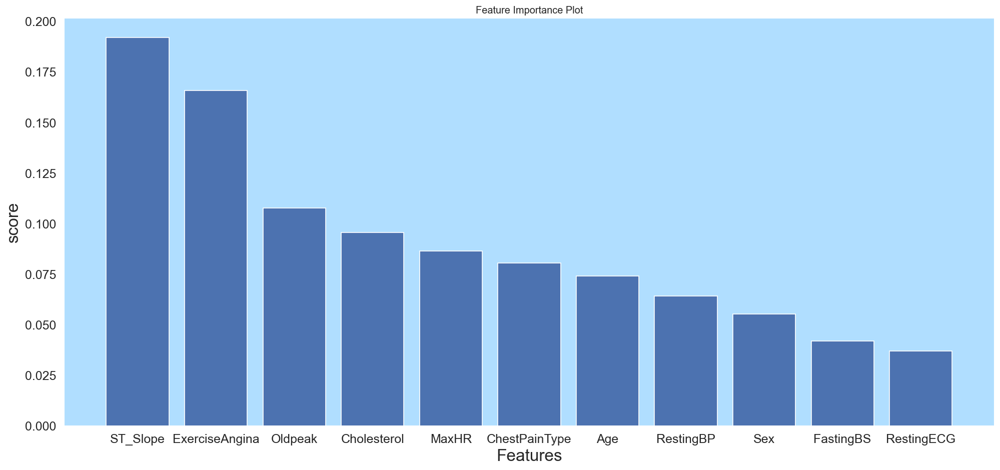

In [289]:
plt.bar(feature_importance_score_nlarge['Features'] , feature_importance_score_nlarge['Score'])
plt.xlabel('Features')
plt.ylabel('score')
plt.title('Feature Importance Plot')

In [ ]:
plt.figure(figsize = (10,5))
px.bar(y =  feature_importance_score_nlarge['Score'] ,x = feature_importance_score_nlarge['Features']  , title = '<b> Feature importance plot </b>' , template = 'plotly_dark')

# 5. Model Building

In [193]:
from sklearn.neighbors import KNeighborsClassifier

In [194]:
model = KNeighborsClassifier(n_neighbors = 5)

In [195]:
model

KNeighborsClassifier()

In [197]:
model.fit(x_train , y_train)

KNeighborsClassifier()

In [198]:
y_pred = model.predict(x_test)

In [199]:
y_pred

array([0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 0, 1], dtype=int64)

In [200]:
model.score(x_train ,y_train)

0.8937329700272479

In [201]:
model.score(x_test , y_test)

0.8478260869565217

## Optimum K value by Error rate

In [211]:
error_rate = []
k_list = []
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(x_train , y_train)
    pred_i = knn.predict(x_test)
    error_rate.append(np.mean(y_test != pred_i))
    k_list.append(i)

In [212]:
error_rate

[0.1793478260869565,
 0.21195652173913043,
 0.16304347826086957,
 0.15760869565217392,
 0.15217391304347827,
 0.1793478260869565,
 0.15760869565217392,
 0.1793478260869565,
 0.16304347826086957,
 0.15760869565217392,
 0.15217391304347827,
 0.16304347826086957,
 0.15760869565217392,
 0.17391304347826086,
 0.16304347826086957,
 0.16304347826086957,
 0.15217391304347827,
 0.15217391304347827,
 0.14130434782608695,
 0.16847826086956522,
 0.15760869565217392,
 0.16847826086956522,
 0.16847826086956522,
 0.17391304347826086,
 0.16304347826086957,
 0.17391304347826086,
 0.1793478260869565,
 0.16847826086956522,
 0.16847826086956522,
 0.18478260869565216,
 0.17391304347826086,
 0.17391304347826086,
 0.16847826086956522,
 0.16304347826086957,
 0.16847826086956522,
 0.16847826086956522,
 0.16847826086956522,
 0.17391304347826086,
 0.17391304347826086]

In [213]:
k_list

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39]

In [214]:
best_error_rate = min(error_rate)

In [215]:
best_error_rate

0.14130434782608695

In [229]:
k = k_list[error_rate.index(best_error_rate)]

In [230]:
k

19

In [227]:
error_rate[18]

0.14130434782608695

In [231]:
print('The optimum value of k is :' , k ,' value of error rate is : ' , best_error_rate )

The optimum value of k is : 19  value of error rate is :  0.14130434782608695


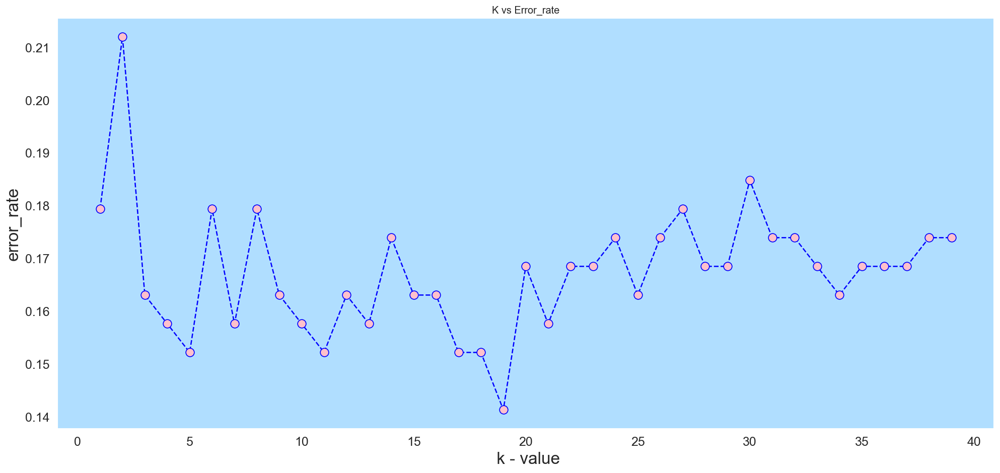

In [237]:
plt.plot(range(1,40) , error_rate , marker = 'o' , markersize = 10 , markerfacecolor = 'pink' , linestyle = 'dashed' , color = 'blue')
plt.xlabel(' k - value')
plt.ylabel('error_rate')
plt.title('K vs Error_rate')
plt.show()

## Optimum K value by precision score

In [241]:
from sklearn.metrics import precision_score
precision_score_list = []
k1_list =[]
for k in range(1,40):
    knn1 = KNeighborsClassifier(n_neighbors = k)
    knn1.fit(x_train , y_train)
    pred_y = knn1.predict(x_test)
    p_score = precision_score(y_test , pred_y , average = 'macro')
    precision_score_list.append(p_score)
    k1_list.append(k)

In [244]:
precision_score_list

[0.8177083333333333,
 0.816093366093366,
 0.8326797385620914,
 0.8443262411347519,
 0.8429821407167686,
 0.8177083333333333,
 0.8378084179970973,
 0.8190307328605201,
 0.8320675105485232,
 0.8394886363636364,
 0.8429821407167686,
 0.8335110795117905,
 0.8378571428571429,
 0.8226093138997511,
 0.8326797385620914,
 0.8335110795117905,
 0.8436125965537731,
 0.8444128451238299,
 0.8545454545454545,
 0.8299054373522459,
 0.8394886363636364,
 0.8299054373522459,
 0.8285984848484849,
 0.823772915434654,
 0.8335110795117905,
 0.823772915434654,
 0.8166824869482676,
 0.8285984848484849,
 0.8285984848484849,
 0.8143684272716532,
 0.823772915434654,
 0.8252392768521801,
 0.8299054373522459,
 0.8361101264327071,
 0.8299054373522459,
 0.8299054373522459,
 0.8299054373522459,
 0.8252392768521801,
 0.8252392768521801]

In [245]:
k1_list

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39]

In [246]:
best_p_score = max(precision_score_list)

In [247]:
best_p_score

0.8545454545454545

In [253]:
best_k = k1_list[precision_score_list.index(best_p_score)]

In [254]:
best_k

19

In [261]:
print('K is :' , best_k , ' Precision score is :' , best_p_score)

K is : 19  Precision score is : 0.8545454545454545


In [252]:
precision_score_list[18]

0.8545454545454545

Text(0.5, 1.0, 'K value vs Precision score')

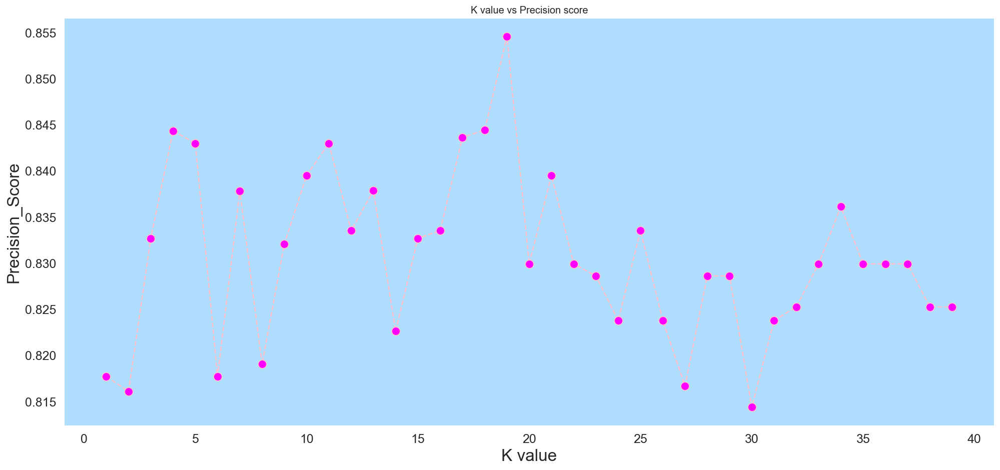

In [259]:
plt.plot(range(1,40),precision_score_list , marker = 'o' , markersize = 10 , markerfacecolor = 'magenta' ,linestyle = '--',color ='pink')
plt.xlabel('K value')
plt.ylabel('Precision_Score')
plt.title('K value vs Precision score') 

##  When k is 19 

In [262]:
knn_2 = KNeighborsClassifier(n_neighbors = 19)
knn_2.fit(x_train, y_train)
pred_y_2 = knn_2.predict(x_test)

In [263]:
pred_y_2

array([0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1,
       0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0,
       1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 0, 1], dtype=int64)

In [264]:
knn_2.score(x_train, y_train)

0.8596730245231607

In [265]:
knn_2.score(x_test , y_test)

0.8586956521739131

In [266]:
cm = confusion_matrix(y_test , pred_y_2)

In [267]:
cm

array([[68,  9],
       [17, 90]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix')

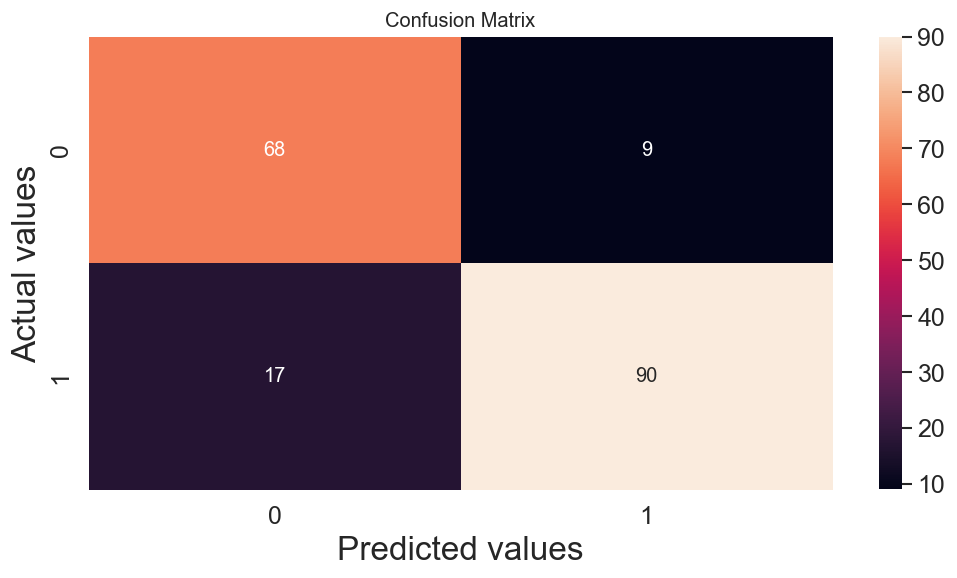

In [288]:
plt.figure(figsize = (10 ,5))
sns.heatmap(cm ,vmin=None,
    vmax=None,
    cmap=None,
    center=None,
    robust=False,
    annot=True,
    fmt='.2g',
    annot_kws=None,
    linewidths=0,
    linecolor='white',
    cbar=True,
    cbar_kws=None,
    cbar_ax=None,
    square=False,
    xticklabels='auto',
    yticklabels='auto',
    mask=None,
    ax=None)
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Confusion Matrix')

In [278]:
precision_score(y_test , pred_y_2)

0.9090909090909091

In [279]:
recall_score(y_test , pred_y_2)

0.8411214953271028

In [280]:
f1_score(y_test , pred_y_2)

0.8737864077669902

In [283]:
print(classification_report(y_test , pred_y_2))

              precision    recall  f1-score   support

           0       0.80      0.88      0.84        77
           1       0.91      0.84      0.87       107

    accuracy                           0.86       184
   macro avg       0.85      0.86      0.86       184
weighted avg       0.86      0.86      0.86       184

